# Importar Librarias y datos

In [102]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np   
import itertools

from scipy.stats import chi2_contingency, ttest_ind
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.formula.api as smf 

In [103]:
df = pd.read_parquet("output_02.parquet")

In [104]:
df.head()

,age,gender,education,marital_status,race,is_hispanic,employment_commitment,employment_stat,wage_per_hour,working_week_per_year,...,tax_status,gains,losses,stocks_status,citizenship,migration_year,country_of_birth_own,migration_code_change_in_msa,migration_code_change_in_reg,income_above_limit
0,79,Female,High school graduate,Widowed,White,All other,Not in labor force,0,0,52,...,Head of household,0,0,292,Native,95,US,?,?,Below limit
1,65,Female,High school graduate,Widowed,White,All other,Children or Armed Forces,0,0,0,...,Single,0,0,0,Native,94,US,unchanged,unchanged,Below limit
2,21,Male,12th grade no diploma,Never married,Black,All other,Children or Armed Forces,0,500,15,...,Single,0,0,0,Native,94,US,unchanged,unchanged,Below limit
3,2,Female,Children,Never married,Asian or Pacific Islander,All other,Children or Armed Forces,0,0,0,...,Nonfiler,0,0,0,Native,94,US,unchanged,unchanged,Below limit
4,70,Male,High school graduate,Married-civilian spouse present,White,All other,Not in labor force,0,0,0,...,Joint both 65+,0,0,0,Native,95,US,?,?,Below limit


# Observaciones entre Above limit y Below limit


In [143]:
df['income_above_limit'].value_counts()

income_above_limit
Below limit    196501
Above limit     12998
Name: count, dtype: int64

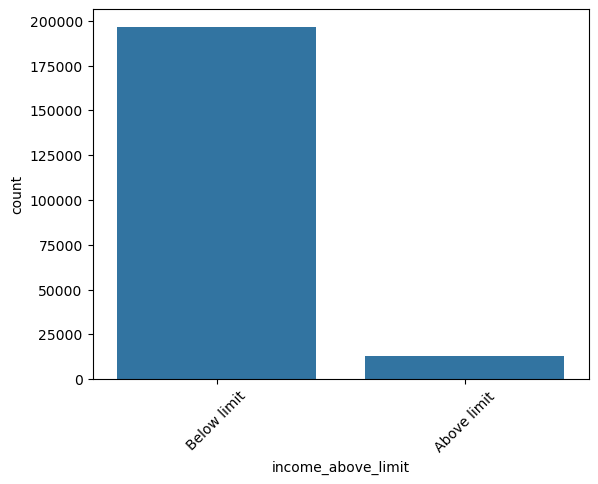

In [140]:
sns.countplot(data=df, x='income_above_limit')
plt.xticks(rotation=45)
plt.show()

# Oberservaciones de los "Above limt"

In [106]:
df['income_above_limit'].unique()

array(['Below limit', 'Above limit'], dtype=object)

In [107]:
df_above = df[df['income_above_limit'] == 'Above limit']

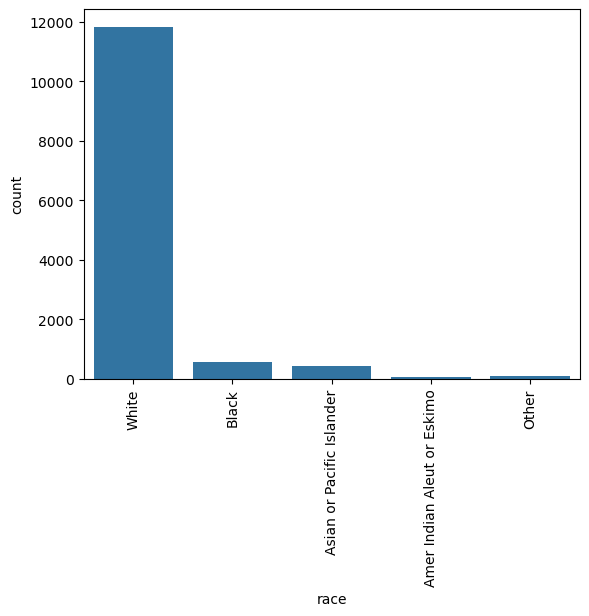

In [108]:
sns.countplot(data=df_above, x='race')
plt.xticks(rotation=90)
plt.show()

C:\Users\rossj\AppData\Local\Temp\ipykernel_37020\884299897.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_above.loc[:, 'age_group'] = pd.cut(df_above['age'],


<Axes: xlabel='age_group', ylabel='count'>

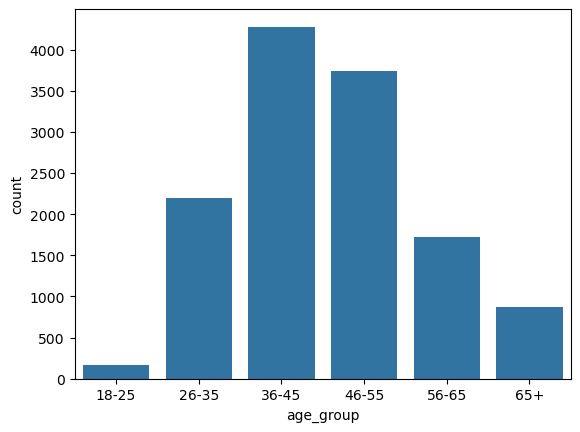

In [109]:
df_above.loc[:, 'age_group'] = pd.cut(df_above['age'], 
                                      bins=[18, 25, 35, 45, 55, 65, 100], 
                                      labels=['18-25', '26-35', '36-45', '46-55', '56-65', '65+'])


sns.countplot(data=df_above, x='age_group', order=['18-25', '26-35', '36-45', '46-55', '56-65', '65+'])


<Axes: xlabel='gender', ylabel='count'>

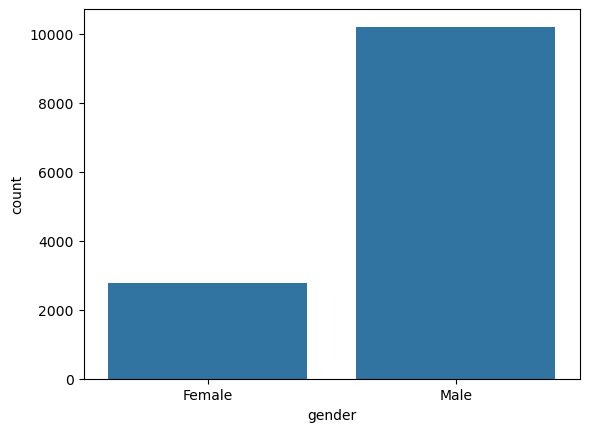

In [110]:
sns.countplot(data=df_above, x='gender')

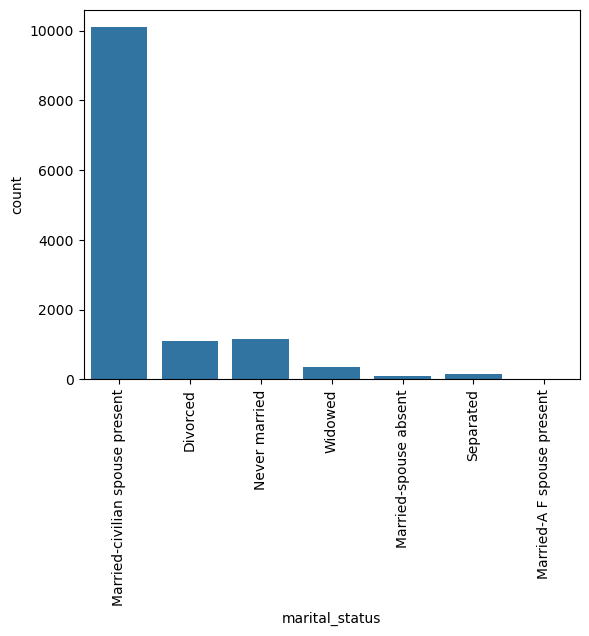

In [111]:
sns.countplot(data=df_above, x='marital_status')
plt.xticks(rotation=90)
plt.show()

# Separación de las columnas en numéricas y categóricas. 

In [113]:
df_numeric = df.select_dtypes(include=[np.number])
df_categorical = df.select_dtypes(exclude=[np.number])

print(df_numeric.shape)
print(df_categorical.shape[1])

(209499, 10)
14


# Visualizar los objectos

En las columnas que contienen datos categóricos podemos ver algunas cosas inusuales en los datos.
La columna `country_of_own_birth` (*país de nacimiento*) representa más del **90%** de los datos en la columna de `"US"`, y `"?"` es el tercer más común.  
Esto sugiere que deberíamos clasificarla entre `"US"` y `"Other"`.
s.

La columna housing_stat contiene una amplia variedad de categorías que contienen mucha repetición, que se pueden simplificar.

La educación se puede simplificar de la misma manera.

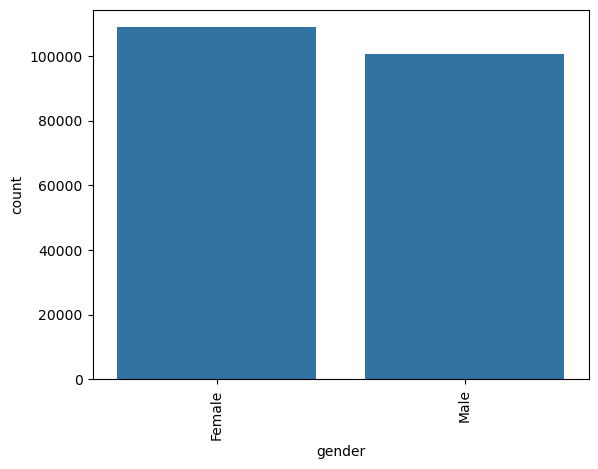

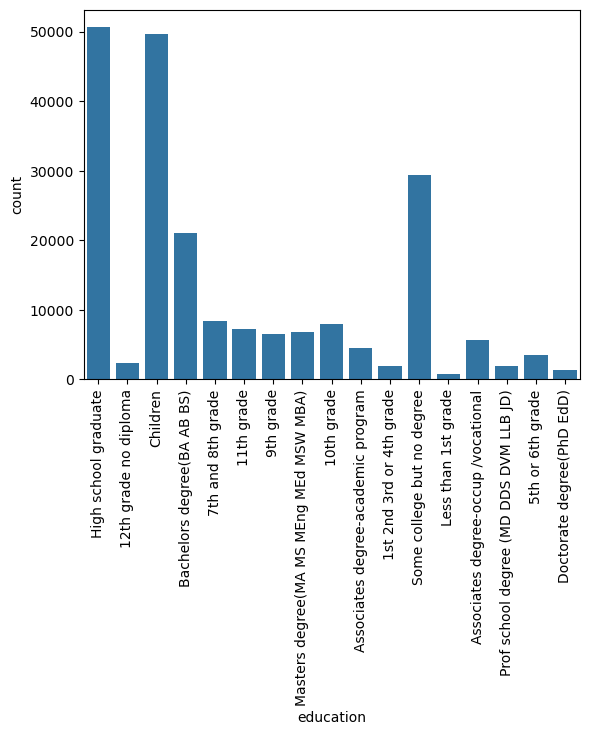

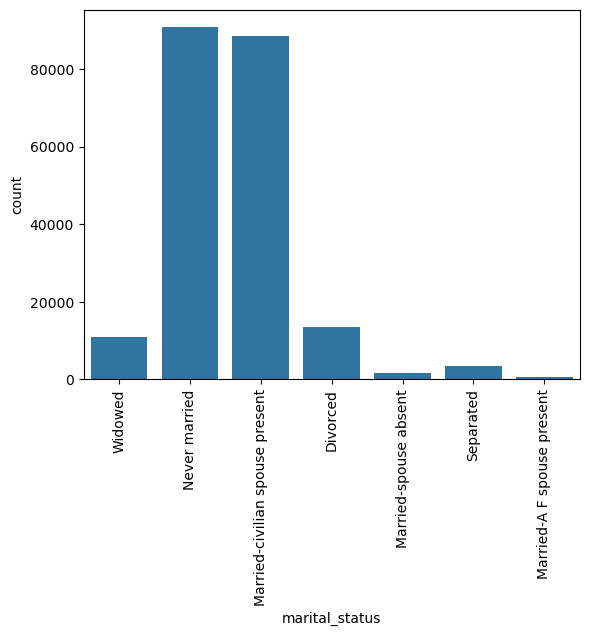

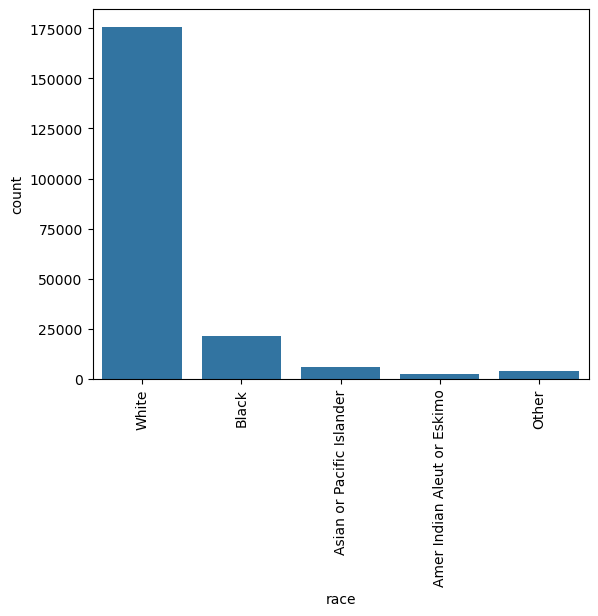

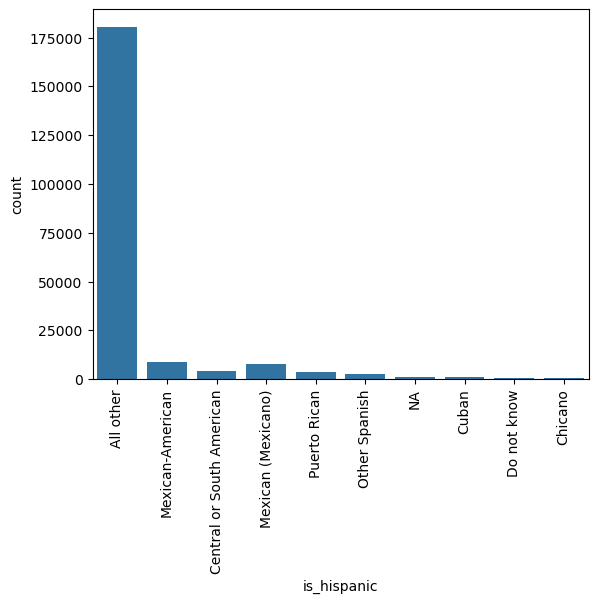

...

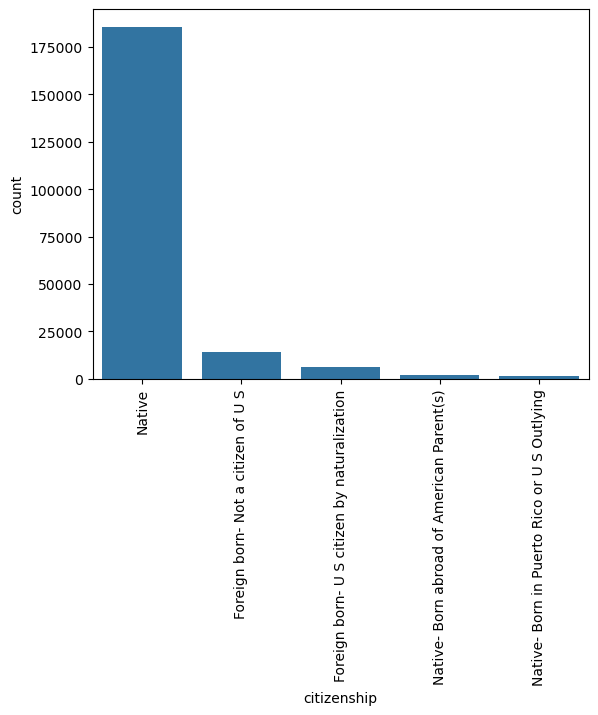

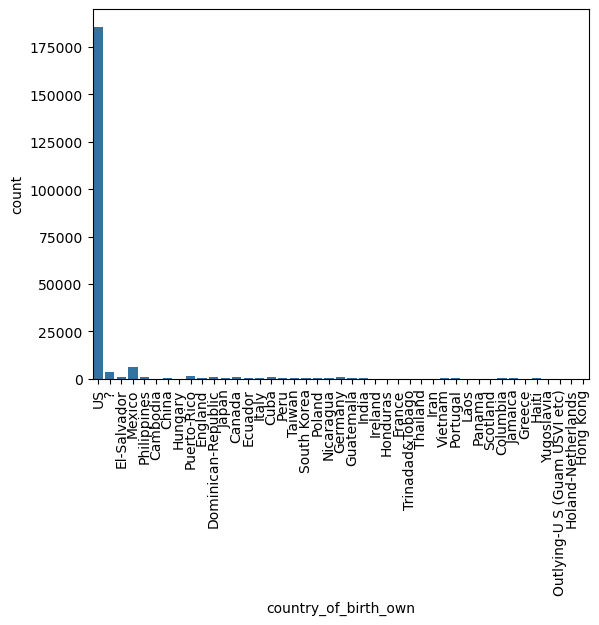

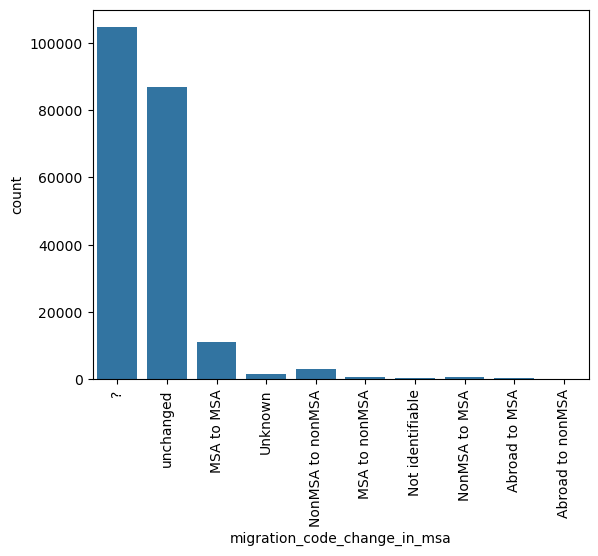

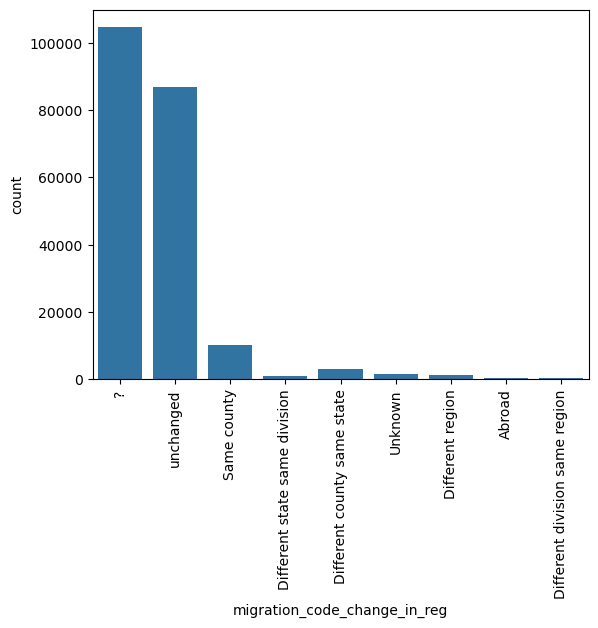

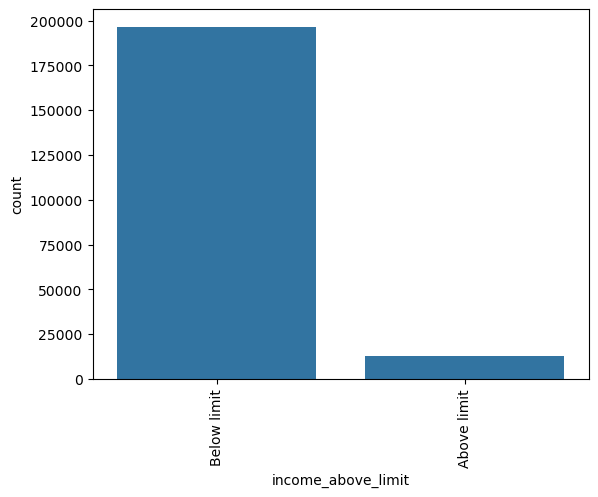

In [115]:
for i in df_categorical.columns:
    sns.countplot(data=df_categorical, x=i)
    plt.xticks(rotation=90) 
    plt.show()

## Uso de itertools para hacer comparaciones visuales entre datos categóricos sin repiticiones.

Esto resalta la cantidad de niños en los datos. Posiblemente sea una pregunta sobre si deberíamos filtrar por edad.

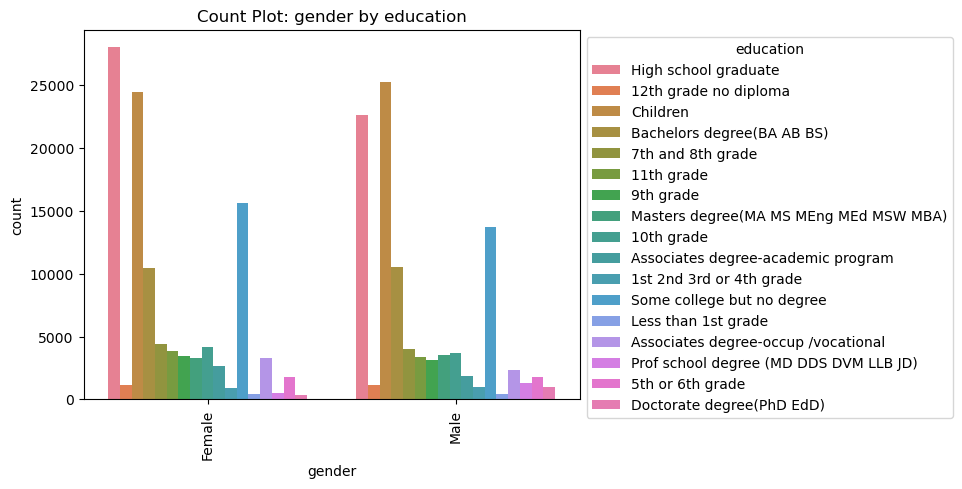

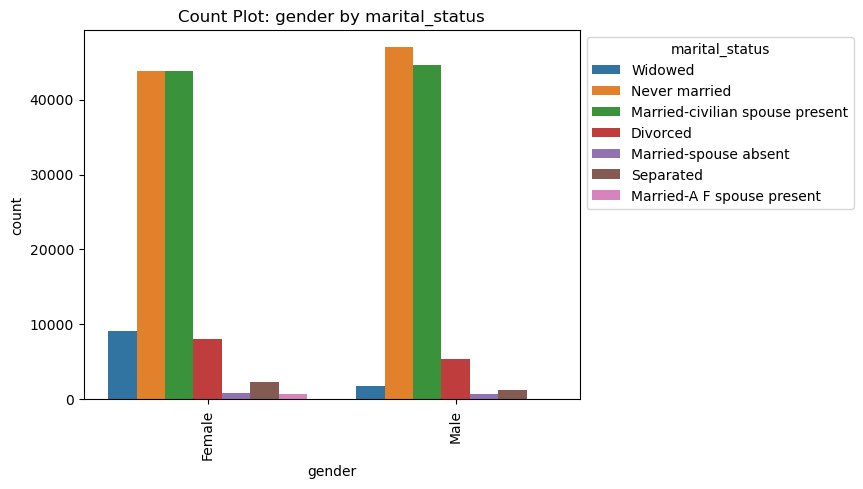

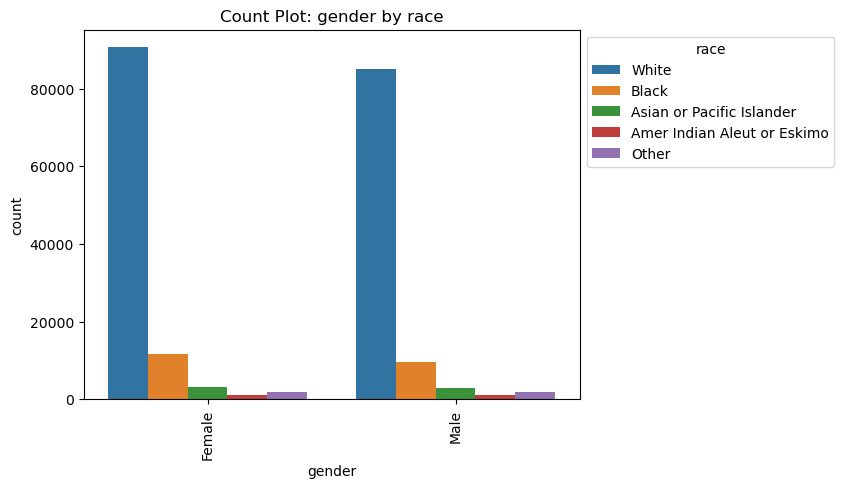

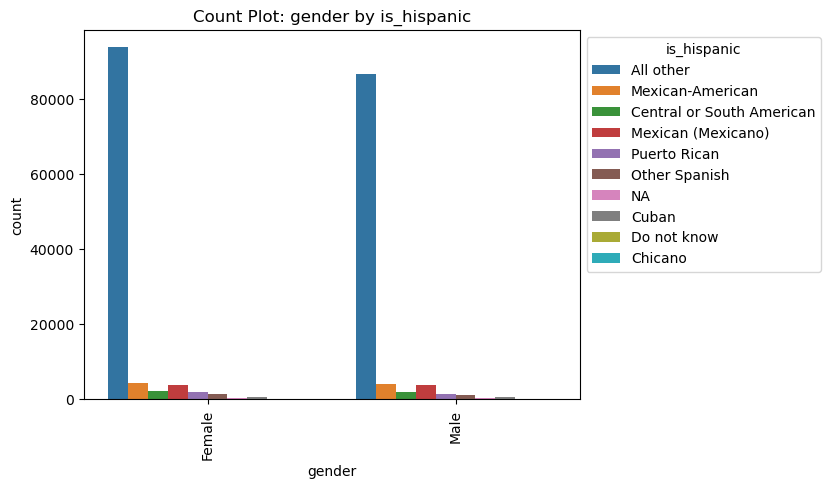

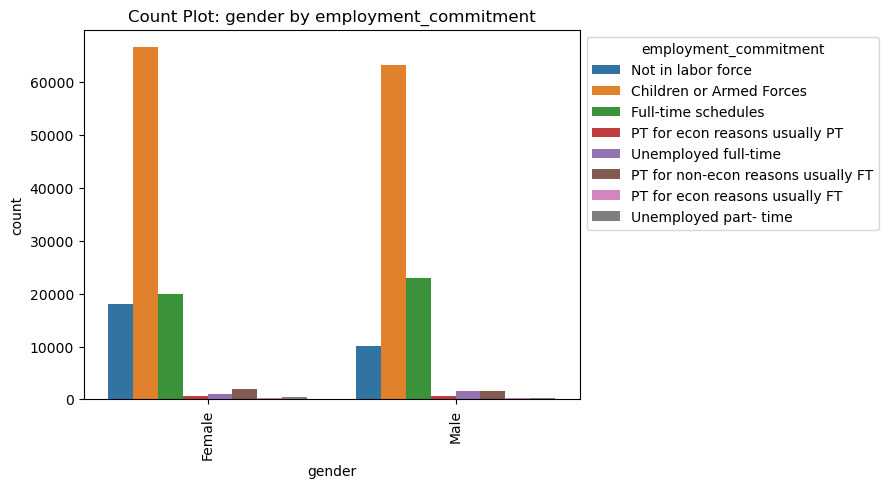

...

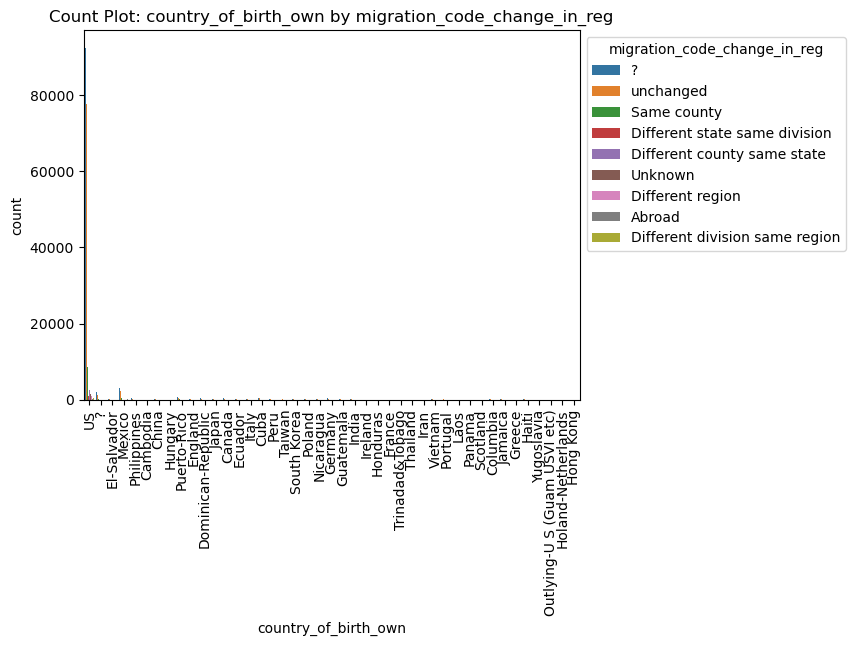

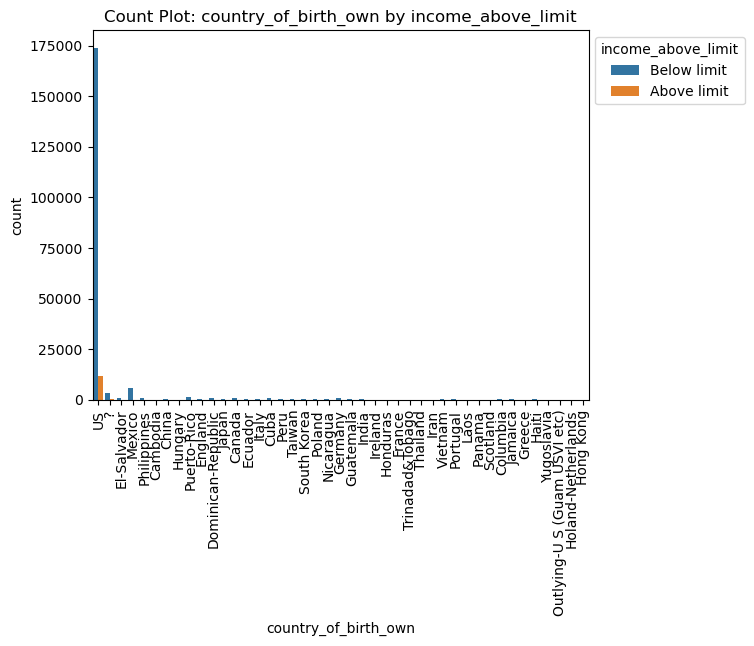

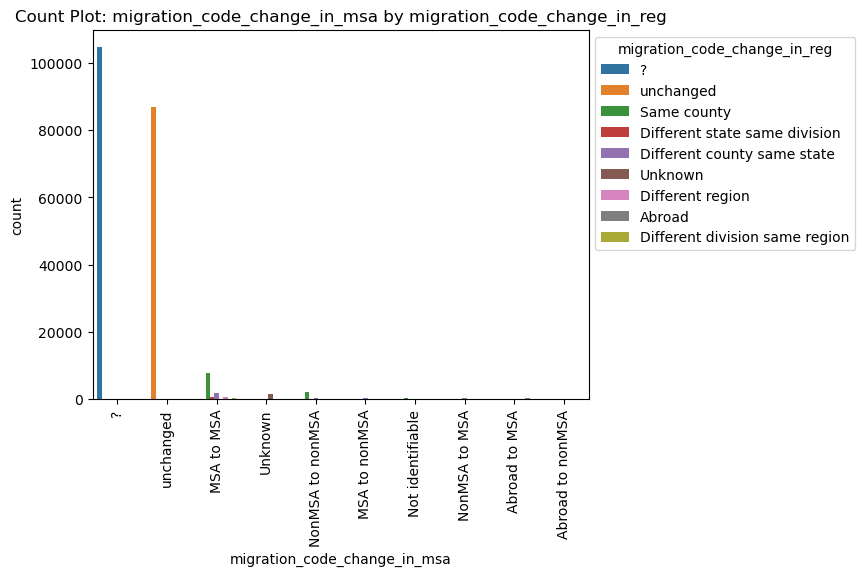

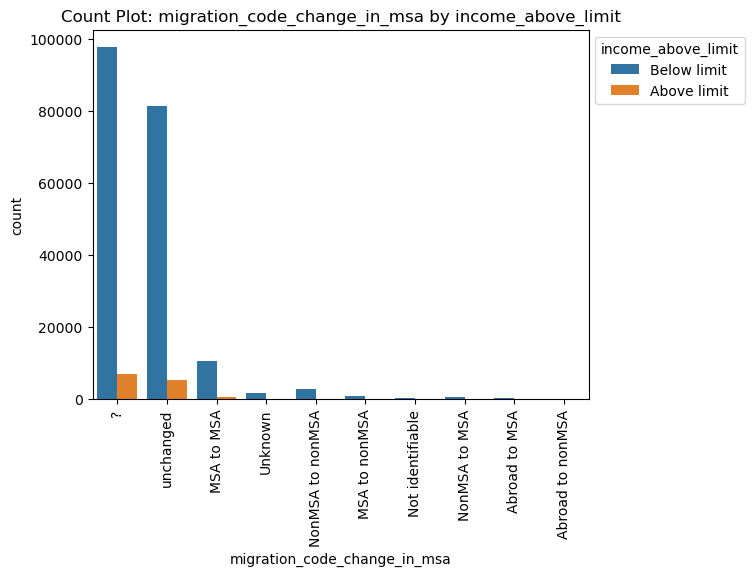

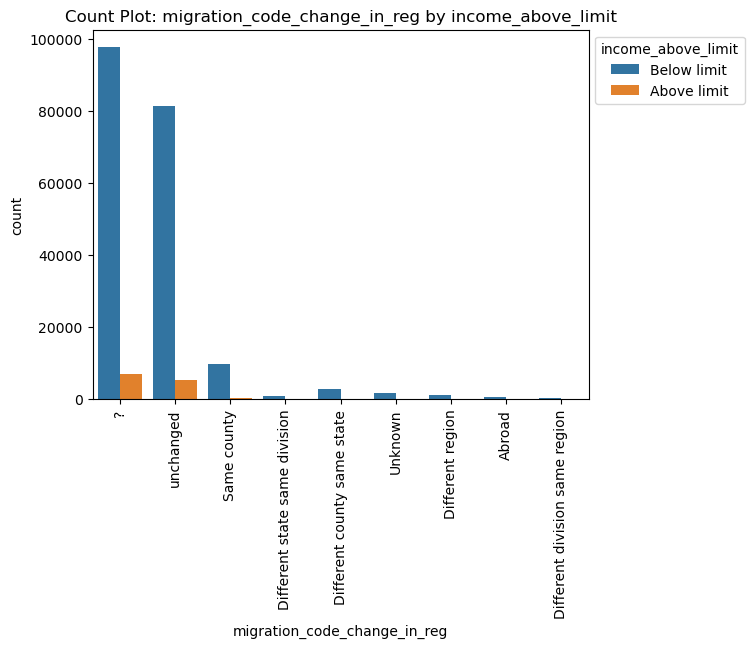

In [117]:
for x_col, y_col in itertools.combinations(df_categorical, 2):
    sns.countplot(data=df_categorical, x=x_col, hue=y_col)
    plt.xticks(rotation=90)
    plt.title(f"Count Plot: {x_col} by {y_col}")
    plt.legend(title=y_col)
    plt.legend(title=y_col, loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

# Visualizar los datos numericos

En las imágenes de los datos numéricos, el año nos muestra solo dos valores.

Hay una cantidad desproporcionada de valores `0` en  
`wage_per_hour`, `gains`, `losses`, `stocks_status`, que provendrán de la cantidad de niños en los datos.
s.

<Axes: xlabel='age', ylabel='Density'>

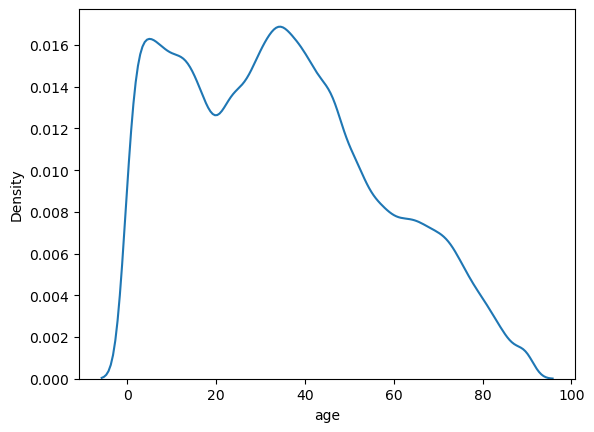

In [119]:
sns.kdeplot(data=df_numeric, x='age')

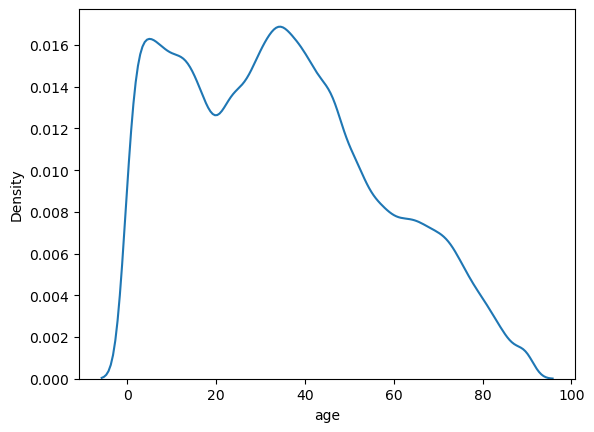

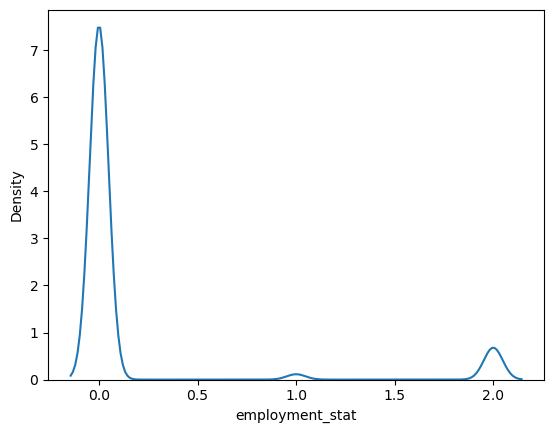

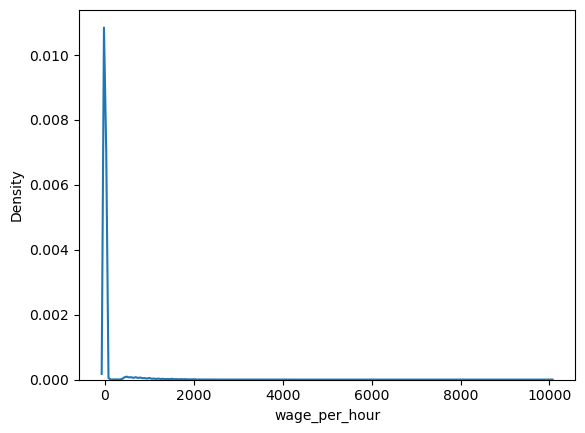

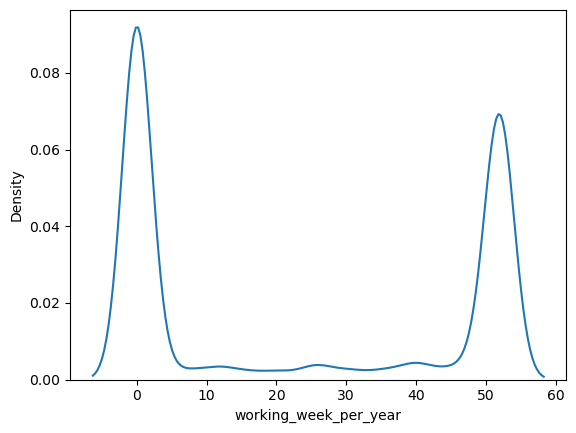

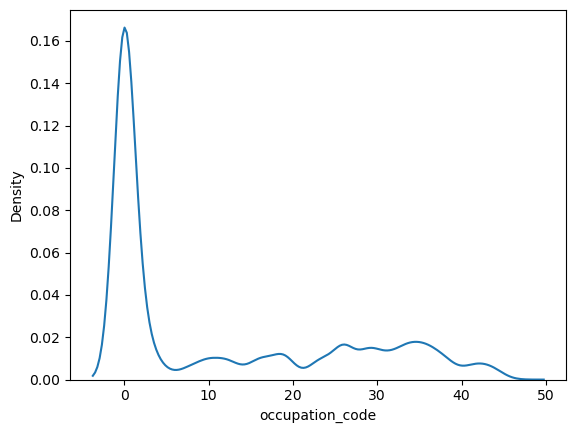

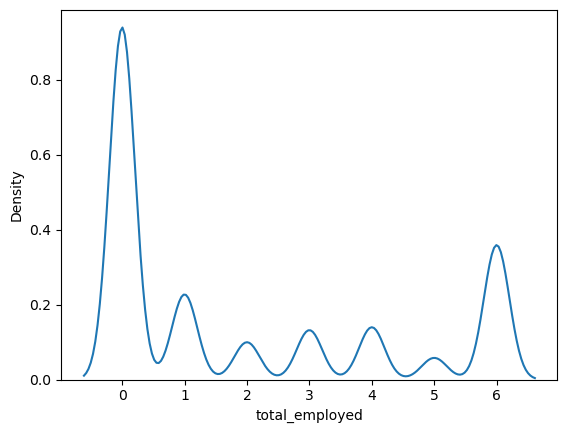

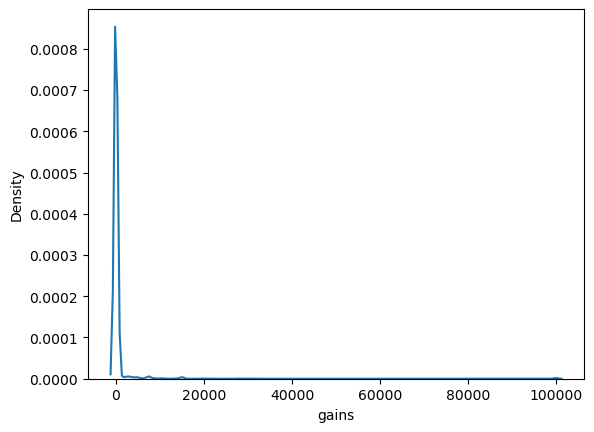

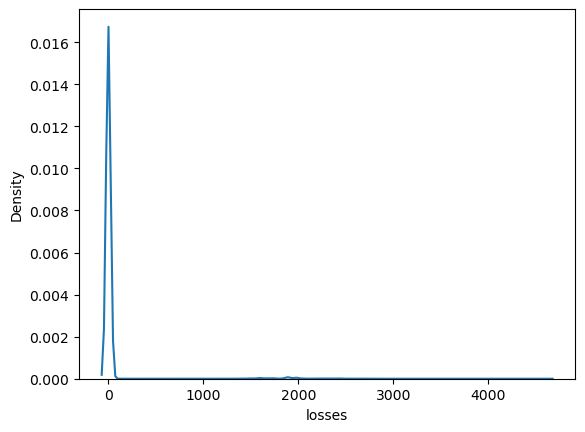

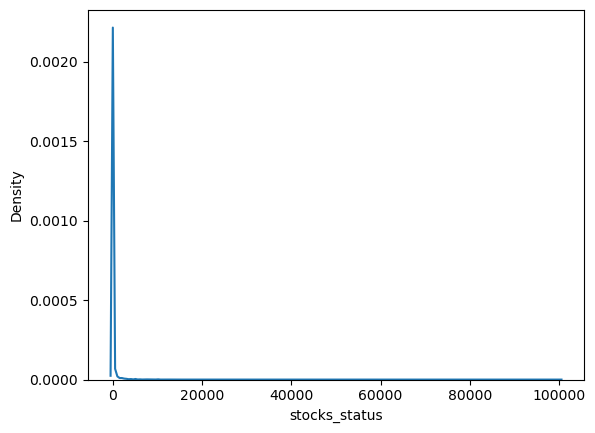

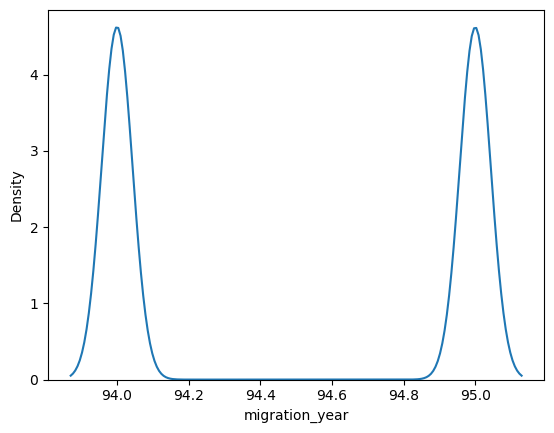

In [120]:
for i in df_numeric:
    sns.kdeplot(data=df_numeric, x=i)
    plt.show()